**Student:** Matias Etcheverry

In [2]:
# imports
import matplotlib.pyplot as plt
import numpy as np
import scipy.io.wavfile as wavfile
from scipy.signal import hamming
from scipy.spatial.distance import cdist

import IPython.display as ipd
from mdct.fast import mdct, imdct

plt.rcParams["figure.figsize"] = (12, 8)


### 1- Open file mix.wav and load it

In [3]:
# useful functions


def plot_sound(data, rate, title=None):
    if data.ndim == 1:
        data = data[:, np.newaxis]
    times = np.arange(data.shape[0]) / rate
    plt.figure(figsize=(30, 6))
    for channel in data.T:
        plt.fill_between(times, channel)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.xlim(times[0], times[-1])
    if title:
        plt.title(title)
    plt.show()


def play_sound(data, rate):
    return ipd.Audio(data.T, rate=rate)


T = 220501, M = 2


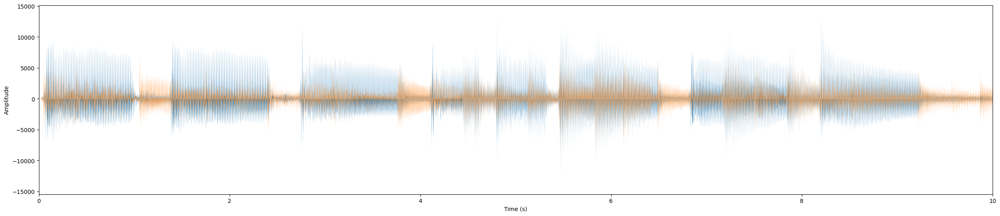

In [4]:
fname = "sons/mix.wav"

rate, x = wavfile.read(fname)
print("T = {:d}, M = {:d}".format(*x.shape))
plot_sound(x, rate)
play_sound(x, rate)


We can hear 3 instruments: a guitar on the right, a bass on the left and a piano in the center.

### 2- Plot the temporal dispersion diagram

Below we plot the temperal dispersion diagram. No direction of the sound can be extracted from it.

Text(0.5, 1.0, 'Temporal dispersion diagram')

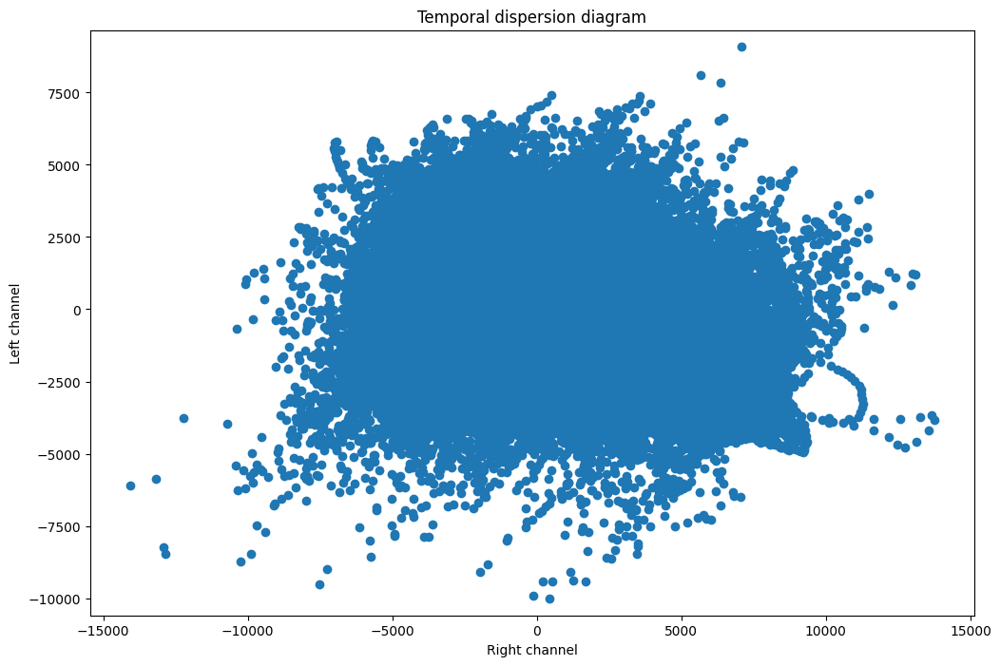

In [5]:
plt.scatter(x[:, 0], x[:, 1])
plt.axis("equal")
plt.xlabel("Right channel")
plt.ylabel("Left channel")
plt.title("Temporal dispersion diagram")


### 3- Compute the MDCT and plot it

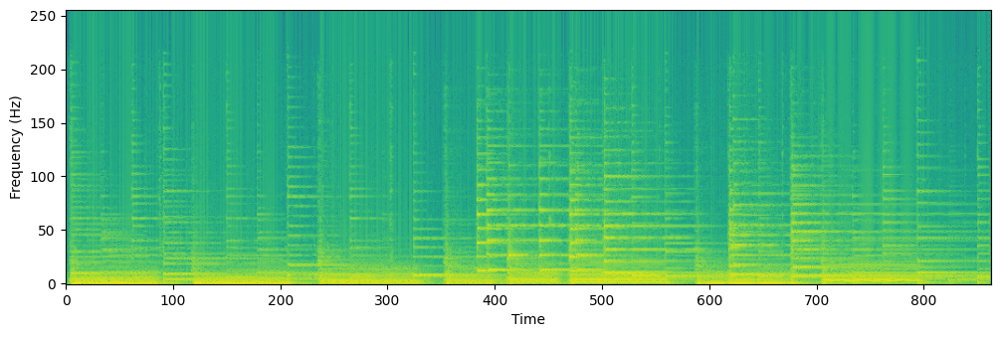

In [6]:
X = mdct(x, window=hamming, framelength=512)
Z = X.view(dtype=np.complex128)[..., 0]

X_norm = np.abs(Z) ** 2

plt.imshow(np.log(X_norm + 1e-10), origin="lower")
plt.xlabel("Time")
plt.ylabel("Frequency (Hz)")
plt.show()


### 4- Time-frequency dispersion diagram

We can distinguish 3 main lines in the time-frequency dispersion diagram

Text(0.5, 1.0, '$Z(f, n)$')

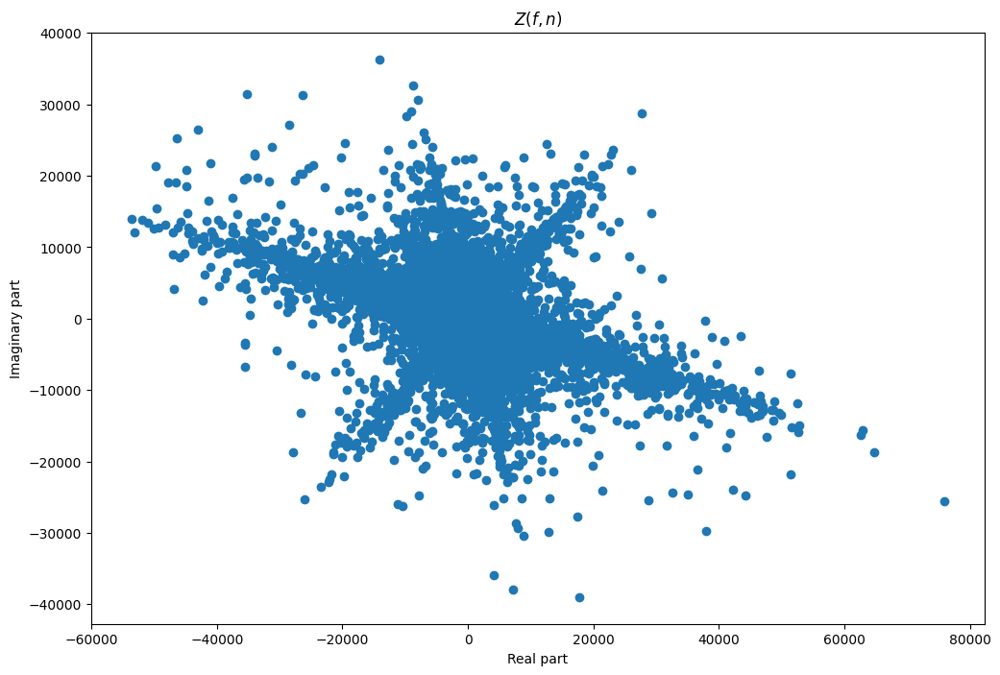

In [7]:
plt.scatter(Z.flatten().real, Z.flatten().imag)
plt.xlabel("Real part")
plt.ylabel("Imaginary part")
plt.title(r"$Z(f, n)$")


### 5- Histogram of the arguments of the points of affix $Z( f, n)$

The 3 modes of the histogram correspond to the angles of the 3 main lines of the plot above.

> Note: a nan value at $\theta=0°$ can be seen, corresponding to an outlier. This nan correponds to the fact that $arctan \frac{b}{a} = nan$ for any real imaginary number $z=a+ib$ with $a=0$.

/home/matias/.pyenv/versions/3.7.12/envs/RECVIS/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.
/home/matias/.pyenv/versions/3.7.12/envs/RECVIS/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in less_equal
  keep = (tmp_a >= first_edge)
/home/matias/.pyenv/versions/3.7.12/envs/RECVIS/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in greater_equal
  keep &= (tmp_a <= last_edge)


Text(0, 0.5, '# Occurences$')

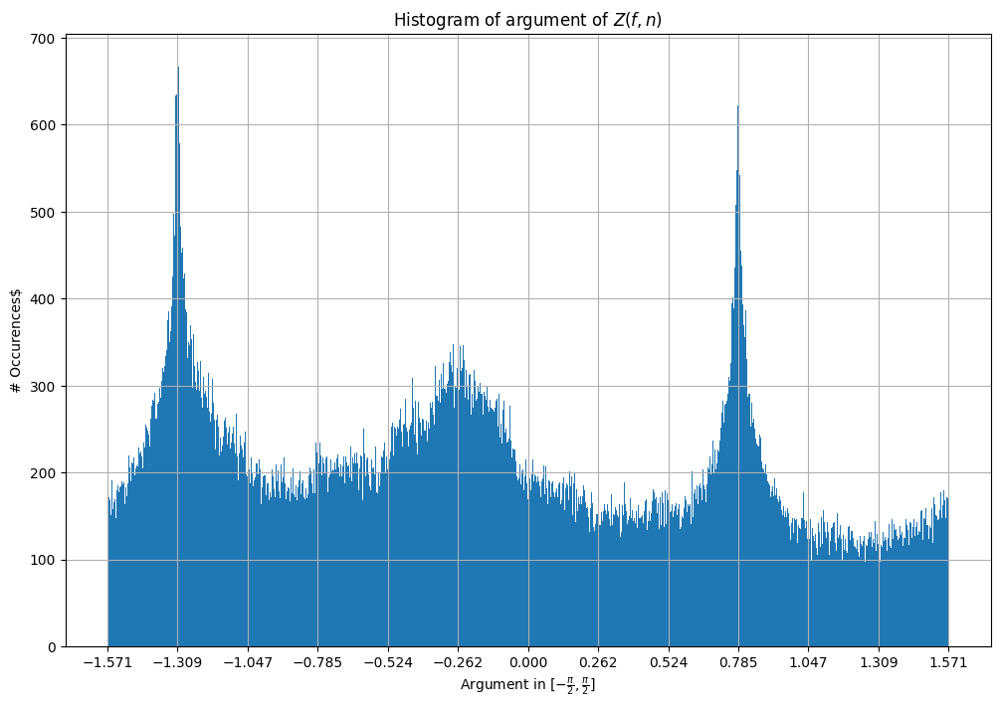

In [21]:
args = np.arctan(Z.imag / Z.real)
plt.grid()
plt.hist(args.flatten(), bins=1050)
plt.xticks(np.linspace(-np.pi / 2, np.pi / 2, 13))
plt.title(r"Histogram of argument of $Z(f, n)$")
plt.xlabel(r"Argument in $[-\frac{\pi}{2},\frac{\pi}{2}]$")
plt.ylabel(r"# Occurences$")


We distinguish 3 angles:
* $\theta(1)$ = -1.309 rad = -75°
* $\theta(2)$ = -0.262 rad = -15°
* $\theta(3)$ = 0.785 rad = 45°

### 6- Estimation of the active source at every time-frequency bin

In [9]:
B = np.zeros((*Z.shape, 3))
thetas = np.array([-1.309, -0.262, 0.785])

distances = np.abs(np.sin(thetas[None, None, :] - args[:, :, None]))

minn = np.amin(distances, axis=-1)
B = (distances <= minn[:, :, None]).astype(int)


Below we reprensent the plane $Z(f,n)$. Each color represents a common $\theta$ shared by all those points.

Text(0.5, 1.0, '$Z(f, n)$')

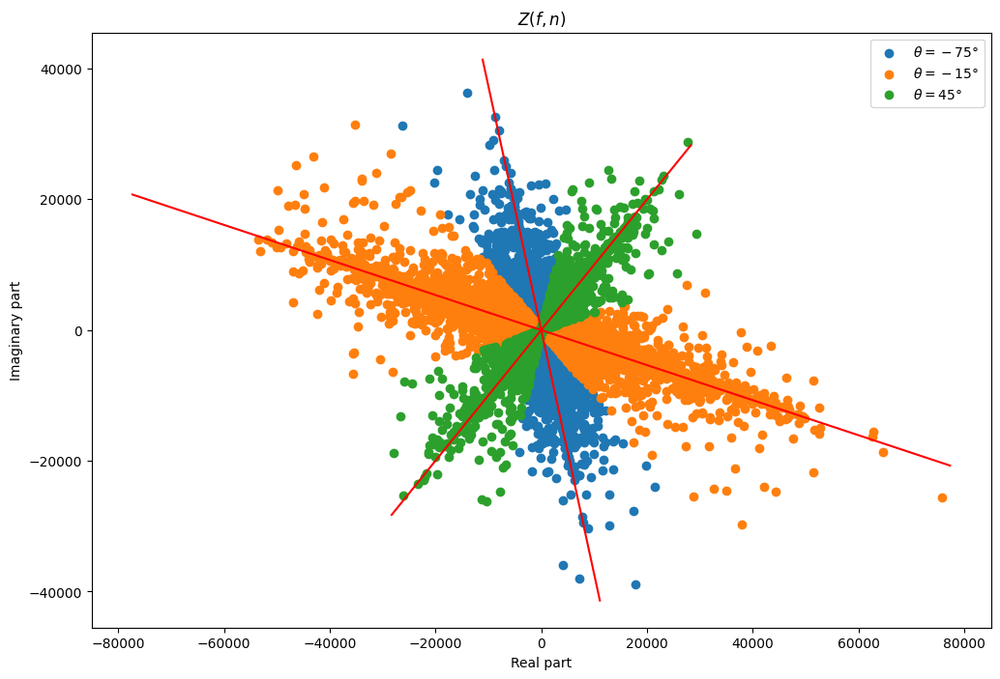

In [10]:
for i, theta in enumerate(thetas):
    mask = B.argmax(axis=-1).flatten() == i
    plt.scatter(
        Z.flatten().real[mask],
        Z.flatten().imag[mask],
        label=r"$\theta={:.0f}°$".format(theta / np.pi * 180),
    )

    max_modulus = np.max(np.abs(Z.flatten()[mask]))
    points = np.linspace(-max_modulus, max_modulus, 100) * np.exp(1j * theta)
    plt.plot(points.real, points.imag, color="red")
plt.xlabel("Real part")
plt.ylabel("Imaginary part")
plt.legend()
plt.title(r"$Z(f, n)$")


### 7- Apply masks B to the MDCT $X(f,n,m)$ and apply the inverse MDCT

In [11]:
S1 = X * B[:, :, 0][:, :, None]
S2 = X * B[:, :, 1][:, :, None]
S3 = X * B[:, :, 2][:, :, None]
Y = np.stack((S1, S2, S3), axis=-1)
y = np.stack(
    [imdct(Y[..., i], window=hamming, framelength=512) for i in range(3)], axis=-1
)


/home/matias/.pyenv/versions/3.7.12/envs/RECVIS/lib/python3.7/site-packages/stft/utils.py:53: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return data[slicetuple]
/home/matias/.pyenv/versions/3.7.12/envs/RECVIS/lib/python3.7/site-packages/stft/utils.py:25: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return data[slicetuple]


### 8- Listen to the K reconstructed stereophonic images $y[:, :, k]$.

In [13]:
print("The original sound:")
ipd.display(play_sound(x, rate))
print("The guitar:")
ipd.display(play_sound(y[..., 0], rate))
print("The bass:")
ipd.display(play_sound(y[..., 1], rate))
print("The piano:")
ipd.display(play_sound(y[..., 2], rate))


The original sound:


The guitar:


The bass:


The piano:


We notice some noise.

### 9- Compute the MMSE estimator $S(f, n, k)$ of source $k$.


In [14]:
a = np.stack([np.cos(thetas), np.sin(thetas)], axis=0)
Y_MMSE = []
for index_instrument in range(3):
    Y_MMSE.append(
        Y[:, :, 0, index_instrument] * a[0, index_instrument]
        + Y[:, :, 1, index_instrument] * a[1, index_instrument]
    )
Y_MMSE = np.stack(Y_MMSE, axis=-1)
y_MMSE = np.stack(
    [imdct(Y_MMSE[..., i], window=hamming, framelength=512) for i in range(3)], axis=-1
)

print("The original sound:")
ipd.display(play_sound(x, rate))
print("The guitar:")
ipd.display(play_sound(y_MMSE[..., 0], rate))
print("The bass:")
ipd.display(play_sound(y_MMSE[..., 1], rate))
print("The piano:")
ipd.display(play_sound(y_MMSE[..., 2], rate))


The original sound:


The guitar:


The bass:


The piano:


The results are smoothing a bit the noise, so we don't hear it in the opposite speaker from the source.

## 10- Respatialize the sources

We can respatialize the sources by multiplying the 2 channels of the MDCT by any rotation vector of the form $[\cos \alpha, \sin \alpha]$.

However, the obtained sound is more noisy than the original.

In [15]:
def rotate(Y, theta):
    c = Y[..., 0] + 1j * Y[..., 1]
    if theta == float:
        theta = np.array(theta)[None, None]
    rotated = np.exp(1j * -theta) * c
    return np.stack([rotated.real, rotated.imag], axis=-1)


Y_new = []
new_thetas = - thetas
for index_instrument, theta in enumerate(thetas):
    normalize = rotate(Y[..., index_instrument], theta)
    Y_new.append(rotate(Y[..., index_instrument], new_thetas[index_instrument]))
Y_new = np.stack(Y_new, axis=-1)


y_norm = np.stack(
    [imdct(Y_new[..., i], window=hamming, framelength=512) for i in range(3)], axis=-1
)
final_sound = y_norm.sum(axis=-1)

print("The original sound:")
ipd.display(play_sound(x, rate))
print("The rotated sound:")
ipd.display(play_sound(final_sound, rate))

The original sound:


The rotated sound:
